# Experiment for Alignment Between Text Name and Manuscript Signature Image

#### Import all necessary libraries



In [ ]:
import os
from pathlib import Path
from typing import List, Tuple
from PIL import Image
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
from transformers import CLIPProcessor, CLIPModel, AutoConfig, AutoModel, AutoProcessor
import matplotlib.pyplot as plt
import json
from google.colab import drive
from collections import defaultdict
import random
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, roc_auc_score, roc_curve
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2


### Get and organize dataset

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
source_path = '/content/drive/MyDrive/Datasets/dataset-final.zip'
destination_path = '/content/'
!cp "{source_path}" "{destination_path}"
!unzip -q "{destination_path}dataset-final.zip"

In [ ]:
dataset_test = pd.read_csv('/content/dataset.csv')
dataset_test.head()

,document,human_name,llm_name,image_path,source
0,efm53d00,A A MACKINNON,A MACKINNON,signatures/efm53d00_sign3.png,outros
1,cxk72e00-page03_3,ADOLFO KUENNEN,ADOLFO KUENNEN,signatures/cxk72e00-page03_3_sign1.png,outros
2,gsa_LAL50124-SLA-1-_Z-01,ADRIANA SANCHEZ,CHAD SANDS,signatures/gsa_LAL50124-SLA-1-_Z-01_sign3.png,gsa
3,X_031,ALAN X HUM,ALAN L HUM,signatures/X_031_sign1.png,x_dataset
4,nist_r0025_01,ALBUR R BELL,ARTHUR T BELL,signatures/nist_r0025_01_sign2.png,nist


In [ ]:
dataset_test.loc[
    dataset_test["human_name"] != "UNKNOWN",
    "human_name"
].nunique()

753

In [ ]:
len(dataset_test[dataset_test["human_name"] != "UNKNOWN"].reset_index(drop=True))

3647

### Define config parameters

In [ ]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

    torch.backends.cudnn.benchmark = False
    random.seed(seed)
    np.random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    print(f'Random seed set as {seed}')

In [ ]:
SEED = 5932
IMAGE_SIZE = 224
MODEL_NAME = "wkcn/TinyCLIP-ViT-40M-32-Text-19M-LAION400M"
OUTPUT_DIR = "/content/fine_tuned_tinyclip" # Corrected to be a string
BEST_MODEL_PATH = f"{OUTPUT_DIR}/epoch11"
EPOCHS = 20
BATCH_SIZE = 8
LR = 1e-6
WEIGHT_DECAY = 0.01
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MARGIN: float = 0.2
CONTRASTIVE_WEIGHT = 0.2
USE_AMP = True
MAX_GRAD_NORM = 1.0
NUM_WORKERS = 4
SAVE_EVERY = 1
LOG_INTERVAL = 50

set_seed(SEED)

Random seed set as 5932


#### Load the raw dataset and make text/image pairs

In [ ]:
# Load the full dataset (assuming it's available at /content/dataset.csv from previous steps)
dataset_all = pd.read_csv('/content/dataset.csv')
dataset_all = dataset_all[dataset_all["human_name"] != "UNKNOWN"].reset_index(drop=True)

# Get all unique human names
unique_names = dataset_all['human_name'].unique()

# Split unique names into training and validation sets (85/15 ratio)
train_names, val_names = train_test_split(
    unique_names,
    test_size=0.15,
    random_state=SEED  # Use the defined SEED for reproducibility
)

# Filter the full dataset to create train_df and val_df
train_df = dataset_all[dataset_all['human_name'].isin(train_names)]
val_df = dataset_all[dataset_all['human_name'].isin(val_names)]

# Now create the pairs from the newly generated dataframes
train_pairs = list(zip(train_df["image_path"].tolist(), train_df["human_name"].tolist()))
val_pairs = list(zip(val_df["image_path"].tolist(), val_df["human_name"].tolist()))

print(f"Size of training set: {len(train_pairs)}")
print(f"Size of validation set: {len(val_pairs)}")

# Verify that no human_name is in both sets
common_names = set(train_df['human_name'].unique()).intersection(set(val_df['human_name'].unique()))
if len(common_names) == 0:
    print("Verification successful: No human_name appears in both train and validation sets.")
else:
    print(f"Warning: {len(common_names)} human_name(s) appear in both train and validation sets. First one: {list(common_names)[0]}")

Size of training set: 3155
Size of validation set: 492
Verification successful: No human_name appears in both train and validation sets.


#### Preprocess images

In [ ]:
def paste_center_on_canvas(img: Image.Image, canvas_size: int = IMAGE_SIZE, background=(255,255,255)):
    img = img.convert("RGBA")
    w, h = img.size
    scale = min(canvas_size / w, canvas_size / h)
    new_w, new_h = int(w * scale), int(h * scale)
    img_resized = img.resize((new_w, new_h), Image.LANCZOS)
    canvas = Image.new("RGBA", (canvas_size, canvas_size), color=background + (255,))
    offset = ((canvas_size - new_w) // 2, (canvas_size - new_h) // 2)
    canvas.paste(img_resized, offset, img_resized)
    return canvas.convert("RGB")


# Augumentations for the training set
train_transform = A.Compose([
    A.OneOf([
        A.ShiftScaleRotate(
          shift_limit=[-0.0625, 0.0625],
          scale_limit=[-0.1, 0.1],
          rotate_limit=[-10, 15],
          interpolation=cv2.INTER_LINEAR,
          border_mode=cv2.BORDER_CONSTANT,
          rotate_method="ellipse",
          mask_interpolation=cv2.INTER_NEAREST,
          fill=255,
          fill_mask=0
      ),
      A.Downscale(
        scale_range=[0.4, 1],
        interpolation_pair={"upscale":0,"downscale":0}
      )
    ], p=0.2),
    A.OneOf([
        A.MotionBlur(
          blur_limit=[3, 5],
          allow_shifted=False,
          angle_range=[0, 0],
          direction_range=[0, 0]
        ),
        A.GaussNoise(std_range=(0.1, 0.2), p=0.2),
    ], p=0.2),
      A.RandomBrightnessContrast(
        brightness_limit=[-0.2, 0.2],
        contrast_limit=[-0.2, 0.2],
        brightness_by_max=True,
        ensure_safe_range=False,
        p=0.2
      ),
    A.ImageCompression(quality_range=(40, 100), p=0.2),
    ToTensorV2()
])

# Simple transform for validation
val_transform = A.Compose([
    ToTensorV2()
])


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [ ]:
class SignatureNameDataset(Dataset):
    def __init__(self, pairs: List[Tuple[str, str]], transform: A.Compose):
        """
        pairs: lista de (caminho_imagem, texto_nome)
        transform: Albumentations Compose object for image transformations
        """
        self.pairs = pairs
        self.transform = transform

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_path, nome = self.pairs[idx]
        img = Image.open(img_path)
        img = paste_center_on_canvas(img, canvas_size=IMAGE_SIZE)
        img_np = np.array(img)
        img_transformed = self.transform(image=img_np)["image"]
        return {"image": img_transformed, "text": nome}

def collate_fn(batch, processor: CLIPProcessor):
    images = [x["image"] for x in batch]
    texts = [x["text"] for x in batch]
    inputs = processor(images=images, text=texts, return_tensors="pt", padding=True)
    return inputs

##### Make sure to have unique names for each batch.
##### Unless we do that, we can compromisse the contrastive loss

In [ ]:
def build_unique_name_batches(pairs, batch_size=16):
    """
    Gera batches onde nenhum nome se repete.
    """
    # Group by name
    by_name = defaultdict(list)
    for img, name in pairs:
        by_name[name].append(img)

    # Create all image/text pairs
    all_items = [(img, name) for name, imgs in by_name.items() for img in imgs]
    random.shuffle(all_items)

    batches = []
    used_names = set()
    batch = []

    for img, name in all_items:
        if name in used_names:
            continue  # It's already in the batch
        batch.append((img, name))
        used_names.add(name)
        if len(batch) == batch_size:
            batches.append(batch)
            batch = []
            used_names.clear()
    if batch:
        batches.append(batch)
    return batches

#### Create model

In [ ]:
model = CLIPModel.from_pretrained(MODEL_NAME)
processor = CLIPProcessor.from_pretrained(MODEL_NAME)
model = model.to(DEVICE)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/337M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

#### Create Dataset

In [ ]:
dataset = SignatureNameDataset(train_pairs, transform=train_transform)
# Prepara batches únicos
unique_batches = build_unique_name_batches(train_pairs, batch_size=BATCH_SIZE)
print(f"🔹 Total unique batches: {len(unique_batches)}")

🔹 Total unique batches: 390


#### Define Loss Functions

In [ ]:
class CrossEntropyLoss(nn.Module):
    def __init__(self, temperature=0.5):
        super().__init__()
        self.temperature = temperature

    def forward(self, logits_per_image, logits_per_text, labels):
        loss_i2t = F.cross_entropy(logits_per_image, labels)
        loss_t2i = F.cross_entropy(logits_per_text, labels)
        ce_loss = (loss_i2t + loss_t2i) / 2
        return ce_loss


class ContrastiveLoss(nn.Module):
    def __init__(self, temperature=0.5):
        super().__init__()
        self.temperature = temperature
        self.cos = nn.CosineSimilarity(dim=1)

    def is_finite_tensor(self, tensor):
        return torch.all(torch.isfinite(tensor))

    def forward(self, image_embeds, text_embeds, batch_size):
        img_embeds = F.normalize(image_embeds, dim=-1)
        txt_embeds = F.normalize(text_embeds, dim=-1)
        # Similaridades (cosine via dot, pois já normalizado)
        sims = img_embeds @ txt_embeds.t()  # (B, B)
        # diagonais = pares positivos
        pos_sims = sims.diagonal()
        # negativos: máscara
        mask = torch.eye(batch_size, device=DEVICE).bool()
        neg_sims = sims[~mask].view(batch_size, -1)

        # contrastive margin loss (margem + média dos negativos - positivo)
        contrastive_loss = torch.clamp(MARGIN + neg_sims.mean(dim=1) - pos_sims, min=0.0).mean()
        return contrastive_loss, pos_sims, neg_sims

class TripletLoss(nn.Module):
    def __init__(self, margin=MARGIN): # Use the MARGIN defined in config
        super().__init__()
        self.margin = margin
        self.relu = nn.ReLU()

    def forward(self, image_embeds, text_embeds, labels):
        # Normalize embeddings for cosine similarity (already done by the model, but good practice)
        image_embeds = F.normalize(image_embeds, dim=-1)
        text_embeds = F.normalize(text_embeds, dim=-1)

        # Calculate cosine similarities
        # similarities[i][j] is similarity between image_embeds[i] and text_embeds[j]
        similarities = image_embeds @ text_embeds.t() # (B, B)

        # Positive similarities (diagonal)
        positive_sims = similarities.diag() # (B,)

        # Negative similarities: need to select negatives
        # For a given anchor image_embeds[i], the positive text is text_embeds[i].
        # The negative texts are all text_embeds[j] where j != i.
        # We'll use all other texts in the batch as negatives for simplicity.

        # This requires careful indexing or reshaping to get the negative similarities for each anchor.
        # A common way is to use broadcasting or gather operations.
        # Let's compute the loss for each triplet (anchor_i, positive_text_i, negative_text_j where j != i)

        batch_size = image_embeds.size(0)
        loss = 0.0
        num_triplets = 0

        # Iterate through each image as anchor
        for i in range(batch_size):
            anchor_image_embed = image_embeds[i].unsqueeze(0) # (1, D)
            positive_text_embed = text_embeds[i].unsqueeze(0) # (1, D)

            # Calculate similarity with the positive text
            sim_positive = F.cosine_similarity(anchor_image_embed, positive_text_embed) # (1,)

            # Calculate similarity with all other texts (negatives)
            negative_text_embeds = torch.cat([text_embeds[:i], text_embeds[i+1:]], dim=0) # (B-1, D)
            sim_negatives = F.cosine_similarity(anchor_image_embed, negative_text_embeds) # (B-1,)

            # Calculate Triplet loss for this anchor: max(0, sim_negative - sim_positive + margin) for each negative
            # We can use the max over all negatives (Hardest Negative Mining) or average.
            # Let's use average for now, similar to the previous contrastive loss.
            # For Triplet Loss, typically we want sim_positive to be greater than sim_negative by a margin.
            # The loss for a triplet (a, p, n) is max(0, dist(a, p) - dist(a, n) + margin).
            # Using cosine similarity, we want sim(a, p) > sim(a, n).
            # So, the loss is max(0, sim(a, n) - sim(a, p) + margin).

            loss_for_anchor = self.relu(sim_negatives - sim_positive + self.margin) # (B-1,)

            loss += loss_for_anchor.sum()
            num_triplets += (batch_size - 1)

        # Average loss over all possible triplets
        triplet_loss_val = loss / num_triplets if num_triplets > 0 else torch.tensor(0.0, device=image_embeds.device) # Ensure it's a tensor on the correct device

        return triplet_loss_val

In [ ]:
def cosine_similarity(a, b):
    return F.cosine_similarity(a, b)

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
cross_entropy_loss = CrossEntropyLoss()
contrastive_loss = ContrastiveLoss()
triplet_loss = TripletLoss() # Initialize TripletLoss

NameError: name 'model' is not defined

#### Validate the model

In [ ]:
def compute_eer(y_true, y_scores):
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    fnr = 1 - tpr
    eer_threshold = thresholds[np.nanargmin(np.absolute(fnr - fpr))]
    eer = fpr[np.nanargmin(np.absolute(fnr - fpr))]
    # print(f"EER: {eer:.4f} (threshold={eer_threshold:.4f})") # Remove print here
    return eer, eer_threshold

def validate_and_compute_metrics(model, processor, val_pairs, num_negative_samples=3):
    model.eval()
    all_similarity_scores = []
    all_labels = []
    correct_predictions = 0
    total_evaluations = 0

    # Group pairs by name for easier sampling of negative examples
    pairs_by_name = defaultdict(list)
    for img_path, name in val_pairs:
        pairs_by_name[name].append(img_path)

    unique_names = list(pairs_by_name.keys())

    # print(f"🔹 Total unique names in validation set: {len(unique_names)}") # Remove print here

    with torch.no_grad():
        # Evaluate each unique name once
        for name in unique_names:
            # Get all image paths for this name
            matching_img_paths = pairs_by_name[name]
            if not matching_img_paths:
                continue

            # Randomly select one matching image for the positive pair
            matching_img_path = random.choice(matching_img_paths)

            # Select non-matching images (signatures from different names)
            non_matching_img_paths = []
            other_names = [n for n in unique_names if n != name]
            if len(other_names) > 0:
                # Randomly select names for negative samples
                negative_names = random.sample(other_names, min(num_negative_samples, len(other_names)))
                for neg_name in negative_names:
                    # Select a random signature from the negative name
                    neg_img_path = random.choice(pairs_by_name[neg_name])
                    non_matching_img_paths.append(neg_img_path)

            # Create pairs for the current evaluation
            evaluation_pairs = [(matching_img_path, name)] + [(img_path, name) for img_path in non_matching_img_paths] # Use the correct name for all

            # Prepare batch for the current evaluation (one name, multiple images)
            eval_dataset = SignatureNameDataset(evaluation_pairs, val_transform)
            eval_batch = collate_fn(eval_dataset, processor).to(DEVICE)

            # Get embeddings
            eval_outputs = model(**eval_batch)
            image_embeds = eval_outputs.image_embeds
            text_embeds = eval_outputs.text_embeds # This will be the embedding for the current 'name'

            # Calculate similarities between the text embedding and all image embeddings in the batch
            # The first image embedding corresponds to the matching image
            similarities = cosine_similarity(image_embeds, text_embeds.squeeze(0)).tolist() # Compare each image embed with the single text embed

            # The similarity of the matching pair is the first one
            matching_similarity = similarities[0]
            # The similarities of the non-matching pairs are the rest
            non_matching_similarities = similarities[1:]

            # For EER and other metrics, we need all individual similarities and their true labels
            all_similarity_scores.append(matching_similarity)
            all_labels.append(1) # True label is 1 for the matching pair

            for non_matching_sim in non_matching_similarities:
                all_similarity_scores.append(non_matching_sim)
                all_labels.append(0) # True label is 0 for non-matching pairs

            # For custom accuracy: check if the matching similarity is the highest among all similarities in this evaluation batch
            if matching_similarity == max(similarities):
                correct_predictions += 1
            total_evaluations += 1 # One evaluation per unique name


    # Calculate EER using all collected similarity scores and labels
    eer, eer_threshold = compute_eer(all_labels, all_similarity_scores)

    # Calculate custom accuracy
    custom_accuracy = correct_predictions / total_evaluations if total_evaluations > 0 else 0

    # Return the metrics
    return {
        "eer": eer,
        "eer_threshold": eer_threshold,
        "custom_accuracy": custom_accuracy,
        "all_similarity_scores": all_similarity_scores,
        "all_labels": all_labels
    }

def validate_and_visualize(model, processor, val_pairs, num_pairs_to_display=10, num_negative_samples=3):
    # This function is now primarily for visualization after training
    metrics = validate_and_compute_metrics(model, processor, val_pairs, num_negative_samples)

    print("\n### Validation Metrics ###")
    print(f"EER: {metrics['eer']:.4f} (threshold={metrics['eer_threshold']:.4f})")
    print(f"Custom Accuracy (Matching Sim > All Non-Matching Sims): {metrics['custom_accuracy']:.4f}")


    print(f"\n### Showing {num_pairs_to_display} Example Pairs ###")
    # Collect display pairs (similar logic as before, but separate from metric calculation)
    pairs_by_name = defaultdict(list)
    for img_path, name in val_pairs:
        pairs_by_name[name].append(img_path)
    unique_names = list(pairs_by_name.keys())

    with torch.no_grad():
         for name in random.sample(unique_names, min(num_pairs_to_display, len(unique_names))):
            matching_img_paths = pairs_by_name[name]
            if not matching_img_paths:
                continue
            matching_img_path = random.choice(matching_img_paths)

            non_matching_img_paths = []
            other_names = [n for n in unique_names if n != name]
            if len(other_names) > 0:
                negative_names = random.sample(other_names, min(num_negative_samples, len(other_names)))
                for neg_name in negative_names:
                    neg_img_path = random.choice(pairs_by_name[neg_name])
                    non_matching_img_paths.append(neg_img_path)

            evaluation_pairs = [(matching_img_path, name)] + [(img_path, name) for img_path in non_matching_img_paths]
            eval_dataset = SignatureNameDataset(evaluation_pairs, val_transform)
            eval_batch = collate_fn(eval_dataset, processor).to(DEVICE)

            eval_outputs = model(**eval_batch)
            image_embeds = eval_outputs.image_embeds
            text_embeds = eval_outputs.text_embeds
            similarities = cosine_similarity(image_embeds, text_embeds.squeeze(0)).tolist()

            matching_similarity = similarities[0]
            non_matching_similarities = similarities[1:]

            # Create list of images and their similarities for display
            display_images_data = [{
                "img_path": matching_img_path,
                "similarity": matching_similarity,
                "type": "Matching"
            }]
            for i, neg_img_path in enumerate(non_matching_img_paths):
                display_images_data.append({
                    "img_path": neg_img_path,
                    "similarity": non_matching_similarities[i],
                    "type": f"Non-Matching {i+1}"
                })

            # Display the images
            num_images_to_display = 1 + len(non_matching_img_paths)
            if num_images_to_display > 0:
                fig, axes = plt.subplots(1, num_images_to_display, figsize=(5 * num_images_to_display, 5))
                # Ensure axes is iterable even if there's only one subplot
                if num_images_to_display == 1:
                    axes = [axes]

                for i, img_data in enumerate(display_images_data):
                    img = Image.open(img_data['img_path'])
                    axes[i].imshow(paste_center_on_canvas(img, canvas_size=IMAGE_SIZE))
                    axes[i].set_title(f"{img_data['type']}\nSimilarity: {img_data['similarity']:.4f}")
                    axes[i].axis('off')

                prediction_correct = matching_similarity == max(similarities)
                prediction_status = "Correct" if prediction_correct else "Incorrect"
                plt.suptitle(f"{name} - Prediction: {prediction_status}", y=1.02, fontsize=14)
                plt.tight_layout()
                plt.show()

#### Finetune TinyCLIP

In [ ]:
from tqdm.auto import tqdm

best_val_accuracy = 0.0 # Initialize with 0.0 since we want to maximize accuracy
best_model_path = None
validation_accuracies = [] # To store accuracy for plotting later

for epoch in range(EPOCHS):
    model.train()
    total_loss = 0.0
    processed_batches = 0
    sum_pos_sim = 0.0
    sum_neg_sim = 0.0 # Keep tracking negative sim for reporting

    random.shuffle(unique_batches)

    # Wrap unique_batches with tqdm for a progress bar
    batch_iterator = tqdm(unique_batches, desc=f"Epoch {epoch+1}/{EPOCHS} Training", leave=False)

    for step, batch_pairs in enumerate(batch_iterator, start=1):
        # Use the collate_fn to process and batch the data
        dataset_batch = SignatureNameDataset(batch_pairs, train_transform)
        batch = collate_fn(dataset_batch, processor).to(DEVICE)

        with torch.amp.autocast('cuda', enabled=(USE_AMP and DEVICE.type == "cuda")):
            optimizer.zero_grad()

            outputs = model(**batch)
            logits_per_image = outputs.logits_per_image
            logits_per_text = outputs.logits_per_text

            B = logits_per_image.size(0)
            labels = torch.arange(B, device=DEVICE)

            # CLIP CE Loss
            ce_loss = cross_entropy_loss(logits_per_image, logits_per_text, labels)

            # Contrastive Loss (Optional, depending on whether you want to combine or replace)
            # cont_loss, pos_sims, neg_sims = contrastive_loss(outputs.image_embeds, outputs.text_embeds, B)
            # Combined loss = ce_loss + cont_loss * CONTRASTIVE_WEIGHT

            # Triplet Loss
            # Pass image_embeds, text_embeds, and labels (which define positive pairs) to TripletLoss
            trip_loss = triplet_loss(outputs.image_embeds, outputs.text_embeds, labels)

            # Combine losses. You can experiment with the weights.
            # For now, let's combine CE Loss and Triplet Loss
            loss = ce_loss + trip_loss * CONTRASTIVE_WEIGHT # Reuse CONTRASTIVE_WEIGHT for Triplet Loss, or define a new weight

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        processed_batches += 1
        # Still calculate pos and neg sim for reporting, even if not used in loss
        with torch.no_grad():
            _, pos_sims, neg_sims = contrastive_loss(outputs.image_embeds.detach(), outputs.text_embeds.detach(), B)
            sum_pos_sim += pos_sims.mean().item()
            sum_neg_sim += neg_sims.mean().item()


        # Update tqdm description with current batch loss (optional, but helpful)
        batch_iterator.set_postfix(loss=loss.item())


    epoch_avg_loss = total_loss/processed_batches
    epoch_avg_pos_sim = sum_pos_sim/processed_batches
    epoch_avg_neg_sim = sum_neg_sim/processed_batches


    # Validation and Accuracy Calculation
    current_val_accuracy = -1.0 # Initialize with a value that won't be the best initially
    # We still need to run validation to get the accuracy metric.
    # The validate_and_compute_metrics function uses cosine similarity which is consistent
    # regardless of the training loss function used.
    if (epoch + 1) % SAVE_EVERY == 0: # Run validation every SAVE_EVERY epochs
        model.eval() # Set model to evaluation mode
        # Call the refactored function to get metrics
        # We pass num_negative_samples to the validation function
        validation_metrics = validate_and_compute_metrics(model, processor, val_pairs, num_negative_samples=3) # Assuming 3 negative samples as defined in previous calls
        current_val_accuracy = validation_metrics["custom_accuracy"]
        validation_accuracies.append(current_val_accuracy) # Store accuracy


        # Check for best validation accuracy and save model
        if current_val_accuracy > best_val_accuracy:
            best_val_accuracy = current_val_accuracy
            best_model_path = Path(OUTPUT_DIR) / "best" # Save to the 'best' directory
            best_model_path.mkdir(parents=True, exist_ok=True) # Ensure directory exists
            model.save_pretrained(best_model_path)
            processor.save_pretrained(best_model_path)
            print(f"🌟 Nova melhor acurácia de validação ({best_val_accuracy:.4f}). Melhor modelo salvo em: {best_model_path}")


    # Print combined metrics for the epoch
    print(f"✅ Epoch {epoch+1}/{EPOCHS} | Train Loss: {epoch_avg_loss:.4f} | Train Avg Pos Sim: {epoch_avg_pos_sim:.4f} | Train Avg Neg Sim: {epoch_avg_neg_sim:.4f} | Val Accuracy: {current_val_accuracy:.4f} (using {3} neg samples)") # Report num negative samples


    # salvar checkpoints periodicamente (optional)
    if (epoch + 1) % SAVE_EVERY == 0:
        save_path = Path(OUTPUT_DIR) / f"epoch{epoch+1}"
        save_path.mkdir(parents=True, exist_ok=True)
        model.save_pretrained(save_path)
        processor.save_pretrained(save_path)
        print("💾 Checkpoint salvo em:", save_path,"\n")


print("🏁 Fine-tuning finalizado.")

# After training, you can load the best model and run validate_and_visualize with plotting
# Example:
# best_model = AutoModel.from_pretrained(Path(OUTPUT_DIR) / "best")
# best_processor = AutoProcessor.from_pretrained(Path(OUTPUT_DIR) / "best")
# validate_and_visualize(best_model, best_processor, val_pairs, num_pairs_to_display=10, num_negative_samples=3)

Epoch 1/20 Training:   0%|          | 0/390 [00:00<?, ?it/s]

🌟 Nova melhor acurácia de validação (0.9381). Melhor modelo salvo em: /content/fine_tuned_tinyclip/best
✅ Epoch 1/20 | Train Loss: 0.3497 | Train Avg Pos Sim: 0.2865 | Train Avg Neg Sim: 0.1263 | Val Accuracy: 0.9381 (using 3 neg samples)
💾 Checkpoint salvo em: /content/fine_tuned_tinyclip/epoch1 



Epoch 2/20 Training:   0%|          | 0/390 [00:00<?, ?it/s]

🌟 Nova melhor acurácia de validação (0.9735). Melhor modelo salvo em: /content/fine_tuned_tinyclip/best
✅ Epoch 2/20 | Train Loss: 0.0970 | Train Avg Pos Sim: 0.3166 | Train Avg Neg Sim: 0.0882 | Val Accuracy: 0.9735 (using 3 neg samples)
💾 Checkpoint salvo em: /content/fine_tuned_tinyclip/epoch2 



Epoch 3/20 Training:   0%|          | 0/390 [00:00<?, ?it/s]

✅ Epoch 3/20 | Train Loss: 0.0471 | Train Avg Pos Sim: 0.3299 | Train Avg Neg Sim: 0.0655 | Val Accuracy: 0.9292 (using 3 neg samples)
💾 Checkpoint salvo em: /content/fine_tuned_tinyclip/epoch3 



Epoch 4/20 Training:   0%|          | 0/390 [00:00<?, ?it/s]

KeyboardInterrupt: 

#### Load the best model checkpoint

In [ ]:
BEST_MODEL_PATH = "/content/fine_tuned_tinyclip/best/"
model = AutoModel.from_pretrained(pretrained_model_name_or_path = BEST_MODEL_PATH, attn_implementation="eager")
processor = AutoProcessor.from_pretrained(pretrained_model_name_or_path = BEST_MODEL_PATH)
model.eval()
model = model.to(DEVICE)

In [ ]:
from transformers import CLIPModel, CLIPProcessor

model_path = "./checkpoints/tinyclip-signature"

model = CLIPModel.from_pretrained(
    BEST_MODEL_PATH,
    attn_implementation="eager"
)

model.config.output_attentions = True

model = model.to(DEVICE)
model.eval()

processor = CLIPProcessor.from_pretrained(BEST_MODEL_PATH)


#### Show some results on validation set


### Validation Metrics ###
EER: 0.1209 (threshold=0.1565)
Custom Accuracy (Matching Sim > All Non-Matching Sims): 0.9292

### Showing 60 Example Pairs ###


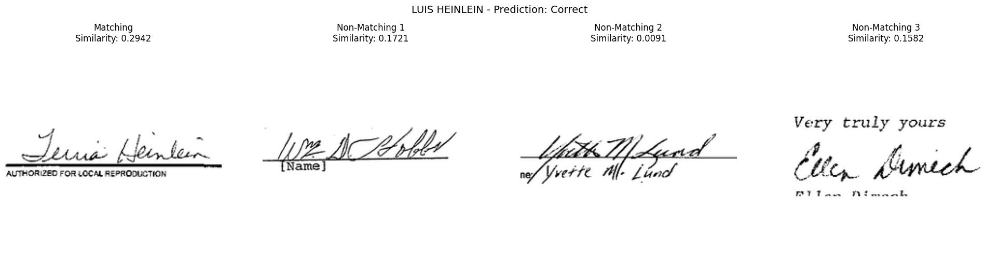

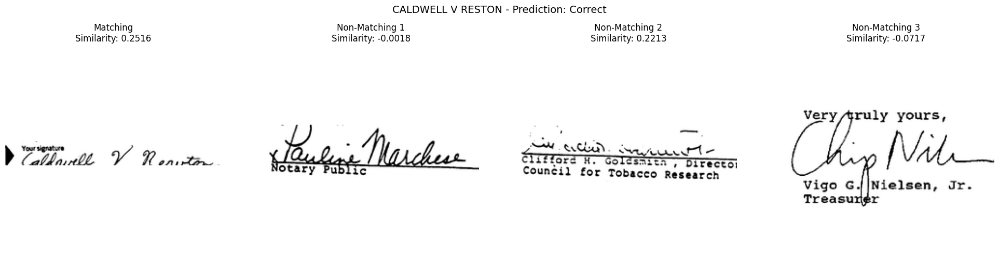

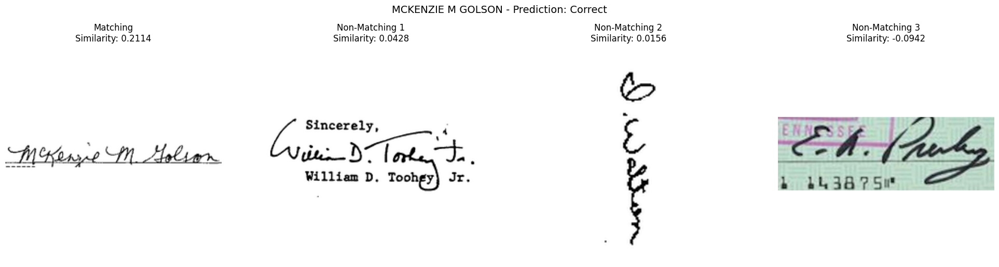

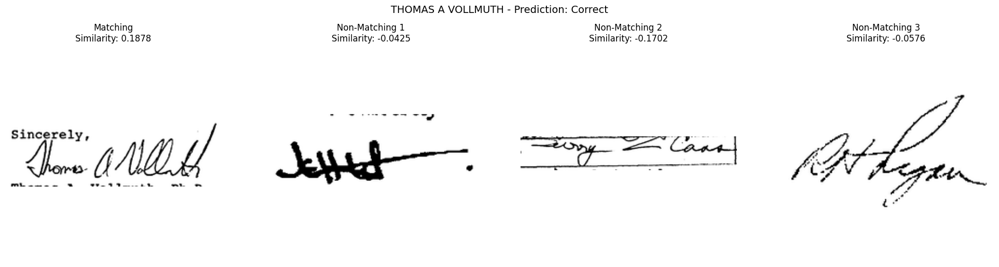

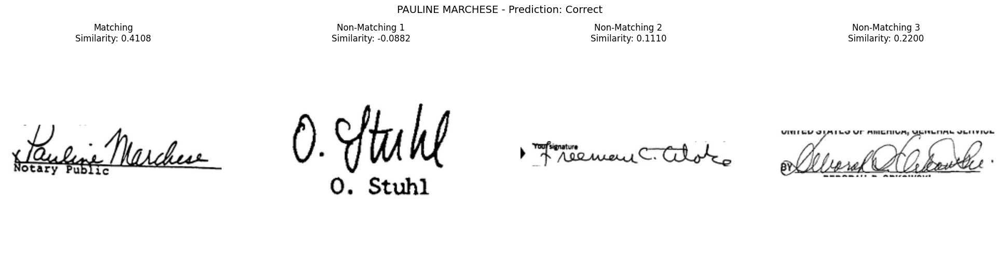

...

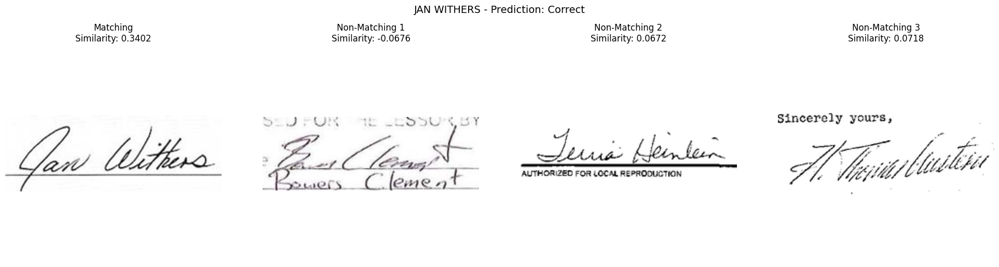

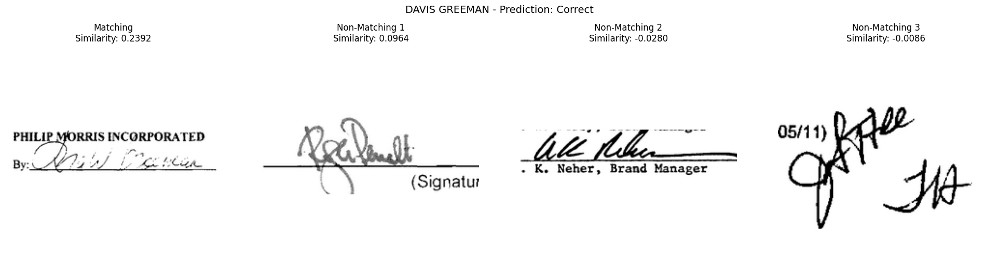

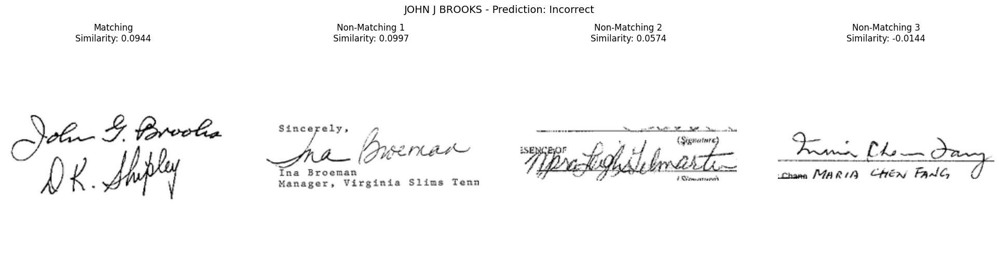

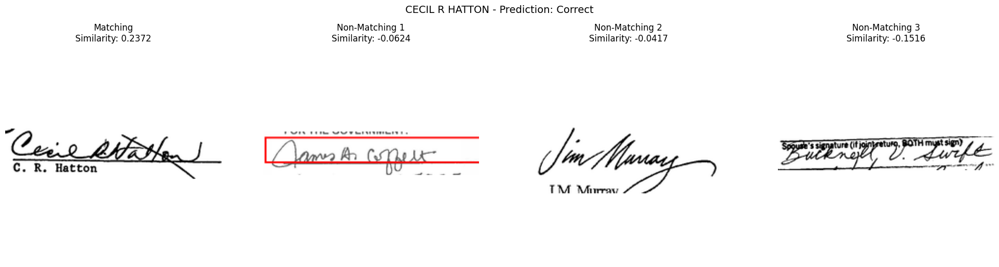

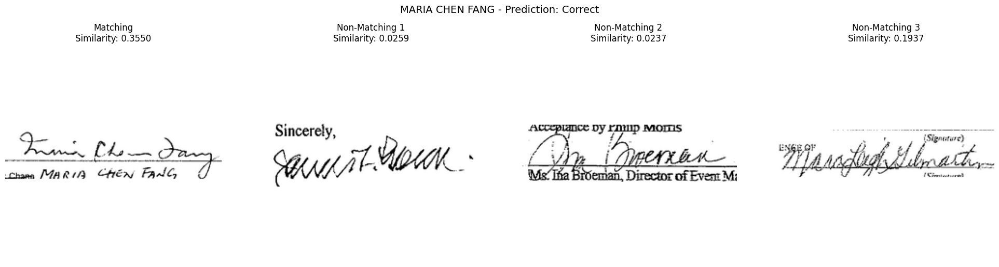

In [ ]:
# Run the validation and visualization
validate_and_visualize(model, processor, val_pairs, 60, 3)

### Attention Rollout

In [ ]:
def clip_attention_rollout(attentions):
    """
    attentions: tuple of tensors (num_layers)
      each: (B, num_heads, N, N)
    """
    # stack layers
    attn = torch.stack(attentions)        # (L, B, H, N, N)
    attn = attn.mean(dim=2)               # avg heads → (L, B, N, N)

    # add skip + normalize
    eye = torch.eye(attn.size(-1), device=attn.device)
    attn = attn + eye
    attn = attn / attn.sum(dim=-1, keepdim=True)

    # rollout
    joint_attn = attn[0]
    for i in range(1, attn.size(0)):
        joint_attn = attn[i] @ joint_attn

    return joint_attn  # (B, N, N)


In [ ]:
def visualize_clip_attention(
    image_path,
    text,
    model,
    processor,
    image_size=224
):
    image = Image.open(image_path)
    image = paste_center_on_canvas(image, image_size)

    inputs = processor(
        images=image,
        text=text,
        return_tensors="pt"
    ).to(DEVICE)

    with torch.no_grad():
        outputs = model(
            **inputs,
            output_attentions=True
        )

    attentions = outputs.vision_model_output.attentions
    joint_attn = clip_attention_rollout(attentions)

    # CLS → patches
    mask = joint_attn[0, 0, 1:]  # remove CLS
    grid = int(np.sqrt(mask.shape[0]))

    cam = mask.reshape(grid, grid).cpu().numpy()
    cam = cv2.resize(cam, (image_size, image_size))
    cam = cam / (cam.max() + 1e-8)

    img_np = np.array(image)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(img_np)
    plt.title("Imagem Original")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(cam, cmap="jet")
    plt.title("Attention Rollout (ViT)")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Texto → Assinatura")
    plt.axis("off")

    plt.suptitle(f"Texto: {text}")
    plt.tight_layout()
    plt.show()


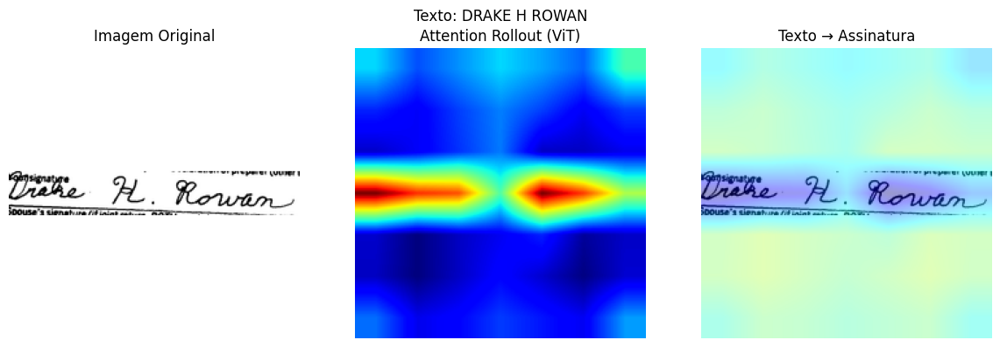

In [ ]:
img_path, name = val_pairs[100]

visualize_clip_attention(
    img_path,
    name,
    model,
    processor
)


### Save Results

In [ ]:
import shutil
import os

# Define the path to the best model directory
best_model_dir = BEST_MODEL_PATH # Using the variable already defined

# Define the output path for the zip file
output_zip_path = "/content/best_model_checkpoint" # You can change the name if you like

# Create the zip archive
shutil.make_archive(output_zip_path, 'zip', best_model_dir)

print(f"Arquivo zip criado em: {output_zip_path}.zip")

Arquivo zip criado em: /content/best_model_checkpoint.zip


In [ ]:
import shutil
import os

# Define the source path (the created zip file)
source_zip_path = "/content/best_model_checkpoint.zip"

# Define the destination path in your Google Drive
# Make sure you have mounted your Google Drive in the notebook
destination_drive_path = "/content/drive/MyDrive/Datasets/best_model_sign_align_ckp.zip"

# Move the file
shutil.move(source_zip_path, destination_drive_path)

print(f"Arquivo movido para: {destination_drive_path}")

Arquivo movido para: /content/drive/MyDrive/Datasets/best_model_sign_align_ckp.zip


Generate three fixed validation datasets. For each unique name in the validation set, select a fixed positive image and a fixed set of negative images. Create three datasets using these fixed positive images and the same fixed set of negative images, varying only the *number* of negative samples included (3, 2, and 1 negative samples per positive example).


#### Calculate metrics

In [ ]:
# 1. Group the validation pairs by name
pairs_by_name = defaultdict(list)
for img_path, name in val_pairs:
    pairs_by_name[name].append(img_path)

unique_names = list(pairs_by_name.keys())

# Store fixed positive image and a pool of negative images for each name
fixed_evaluation_data = {}

# Determine the maximum number of negative samples we need to support (3)
max_negative_samples = 3

# 2. For each unique name, select a fixed positive image
# 3. For each unique name, select a fixed pool of negative image paths
for name in unique_names:
    matching_img_paths = pairs_by_name[name]
    if not matching_img_paths:
        continue # Skip names with no images

    # Select one fixed positive image
    fixed_positive_img = random.choice(matching_img_paths)

    # Select a fixed pool of negative image paths from other names
    non_matching_img_paths_pool = []
    other_names = [n for n in unique_names if n != name]

    # Ensure we have enough negative samples available
    all_negative_images_available = [img for neg_name in other_names for img in pairs_by_name[neg_name]]

    # Randomly sample from the available negative images without replacement
    # We need a pool of at least `max_negative_samples` if possible
    num_to_sample = min(len(all_negative_images_available), max_negative_samples)
    if num_to_sample > 0:
        fixed_negative_img_pool = random.sample(all_negative_images_available, num_to_sample)
    else:
        fixed_negative_img_pool = []


    fixed_evaluation_data[name] = {
        "positive_img": fixed_positive_img,
        "negative_img_pool": fixed_negative_img_pool
    }

# 4. Create three lists of evaluation pairs
val_pairs_3_neg = []
val_pairs_2_neg = []
val_pairs_1_neg = []

# 5. Add the positive pair to all three lists and varying numbers of negative pairs
for name, data in fixed_evaluation_data.items():
    positive_img = data["positive_img"]
    negative_img_pool = data["negative_img_pool"]

    # Add the positive pair (image, name) - the label will be 1
    positive_pair = (positive_img, name)
    val_pairs_3_neg.append(positive_pair)
    val_pairs_2_neg.append(positive_pair)
    val_pairs_1_neg.append(positive_pair)


    # Add negative pairs (negative image, positive name) - the label will be 0
    # Use the positive name for the text pair for consistency with the positive sample evaluation setup
    if len(negative_img_pool) >= 3:
        for i in range(3):
            val_pairs_3_neg.append((negative_img_pool[i], name))
    elif len(negative_img_pool) > 0:
         for i in range(len(negative_img_pool)):
            val_pairs_3_neg.append((negative_img_pool[i], name))


    if len(negative_img_pool) >= 2:
        for i in range(2):
            val_pairs_2_neg.append((negative_img_pool[i], name))
    elif len(negative_img_pool) == 1:
         val_pairs_2_neg.append((negative_img_pool[0], name))


    if len(negative_img_pool) >= 1:
        val_pairs_1_neg.append((negative_img_pool[0], name))


# 9. Shuffle each of the three lists
random.shuffle(val_pairs_3_neg)
random.shuffle(val_pairs_2_neg)
random.shuffle(val_pairs_1_neg)

print(f"Size of val_pairs_3_neg: {len(val_pairs_3_neg)}")
print(f"Size of val_pairs_2_neg: {len(val_pairs_2_neg)}")
print(f"Size of val_pairs_1_neg: {len(val_pairs_1_neg)}")

Size of val_pairs_3_neg: 444
Size of val_pairs_2_neg: 333
Size of val_pairs_1_neg: 222


Run the evaluation function on each of the three fixed validation datasets.


In [ ]:
def validate_and_compute_metrics_fixed(model, processor, fixed_eval_data, num_negative_samples):
    """
    Validates the model using fixed positive and negative samples for each name
    and computes metrics.

    Args:
        model: The model to evaluate.
        processor: The CLIP processor.
        fixed_eval_data: Dictionary where keys are names and values are dicts
                         with 'positive_img' and 'negative_img_pool'.
        num_negative_samples: The number of negative samples to use from the pool
                              for each positive sample evaluation.

    Returns:
        A dictionary containing computed metrics:
        - eer: Equal Error Rate
        - eer_threshold: The similarity threshold at which EER occurs
        - custom_accuracy: Accuracy based on whether the positive similarity
                           is higher than all selected negative similarities for a given name.
        - all_similarity_scores: List of all computed similarity scores.
        - all_labels: List of true labels (1 for positive, 0 for negative).
    """
    model.eval()
    all_similarity_scores = []
    all_labels = []
    correct_predictions = 0 # For the custom accuracy metric
    total_evaluations = 0   # Number of unique names evaluated

    with torch.no_grad():
        # Iterate through each name and its fixed evaluation data
        for name, data in tqdm(fixed_eval_data.items(), desc=f"Validating with {num_negative_samples} neg samples", leave=False):
            positive_img_path = data["positive_img"]
            negative_img_pool = data["negative_img_pool"]

            # Select the specified number of negative samples from the pool
            selected_negative_img_paths = negative_img_pool[:min(num_negative_samples, len(negative_img_pool))]

            # Create the evaluation pairs for this name: 1 positive + selected negatives
            evaluation_pairs_for_name = [(positive_img_path, name)]
            for neg_img_path in selected_negative_img_paths:
                 # Note: The text for negative pairs is still the positive name
                 evaluation_pairs_for_name.append((neg_img_path, name))

            if not evaluation_pairs_for_name:
                continue # Skip if no pairs could be formed

            # Prepare batch for the current evaluation (one name, multiple images)
            # This batch will contain 1 positive image and `num_negative_samples` negative images
            # all compared against the *same* text (the 'name').
            eval_dataset = SignatureNameDataset(evaluation_pairs_for_name, val_transform)
            # Create a small DataLoader just for this name's evaluation batch
            # Use batch_size = len(evaluation_pairs_for_name) to process all at once
            # Ensure batch size is at least 1 if there are pairs
            batch_size_for_name = max(1, len(evaluation_pairs_for_name))
            eval_dataloader = DataLoader(eval_dataset, batch_size=batch_size_for_name, shuffle=False, num_workers=0, collate_fn=lambda b: collate_fn(b, processor))

            # Get the single batch
            batch = next(iter(eval_dataloader)).to(DEVICE)

            # Get embeddings
            inputs = {
                'pixel_values': batch['pixel_values'],
                'input_ids': batch['input_ids'], # This will be the same text embedding repeated
                'attention_mask': batch['attention_mask']
            }
            outputs = model(**inputs)

            image_embeds = outputs.image_embeds # Shape (N, D), where N = 1 + num_neg
            text_embeds = outputs.text_embeds   # Shape (N, D), but all N rows are identical

            # Calculate similarities between image embeddings and the *single* text embedding
            # We can use the first row of text_embeds as the representative text embedding
            single_text_embed = text_embeds[0].unsqueeze(0) # Shape (1, D)

            # Compute similarity using matrix multiplication (dot product of normalized embeddings)
            # Result shape will be (N, 1)
            similarities = image_embeds @ single_text_embed.t()

            # Squeeze the last dimension to get shape (N,) and convert to list
            similarities = similarities.squeeze(1).tolist()

            # The first similarity is for the positive pair
            matching_similarity = similarities[0]
            # The rest are for the negative pairs
            non_matching_similarities = similarities[1:]

            # Collect scores and labels for EER and overall metrics
            all_similarity_scores.append(matching_similarity)
            all_labels.append(1) # True label for the matching pair

            for non_matching_sim in non_matching_similarities:
                all_similarity_scores.append(non_matching_sim)
                all_labels.append(0) # True label for non-matching pairs

            # For custom accuracy: check if the matching similarity is the highest
            # among all similarities in this group (positive + selected negatives)
            if len(similarities) > 0 and matching_similarity == max(similarities):
                 correct_predictions += 1
            total_evaluations += 1 # One evaluation group per unique name


    # Calculate EER using all collected similarity scores and labels
    # Need at least two classes present to compute EER
    if len(set(all_labels)) < 2:
        eer = float('nan') # Not enough classes
        eer_threshold = float('nan')
        print("Warning: Not enough positive and negative samples to compute EER.")
    else:
        eer, eer_threshold = compute_eer(all_labels, all_similarity_scores)

    # Calculate custom accuracy (percentage of names where the positive pair had the highest similarity)
    custom_accuracy = correct_predictions / total_evaluations if total_evaluations > 0 else 0

    # Return the metrics
    return {
        "eer": eer,
        "eer_threshold": eer_threshold,
        "custom_accuracy": custom_accuracy,
        "all_similarity_scores": all_similarity_scores,
        "all_labels": all_labels
    }

# Now, retry calling the function
metrics_3_neg = validate_and_compute_metrics_fixed(model, processor, fixed_evaluation_data, num_negative_samples=3)
metrics_2_neg = validate_and_compute_metrics_fixed(model, processor, fixed_evaluation_data, num_negative_samples=2)
metrics_1_neg = validate_and_compute_metrics_fixed(model, processor, fixed_evaluation_data, num_negative_samples=1)

# Print the results for each
auc_3_neg = roc_auc_score(metrics_3_neg['all_labels'], metrics_3_neg['all_similarity_scores'])
auc_2_neg = roc_auc_score(metrics_2_neg['all_labels'], metrics_2_neg['all_similarity_scores'])
auc_1_neg = roc_auc_score(metrics_1_neg['all_labels'], metrics_1_neg['all_similarity_scores'])


print("\n--- Metrics with 3 Negative Samples ---")
print(f"EER: {metrics_3_neg['eer']:.4f}")
print(f"EER Threshold: {metrics_3_neg['eer_threshold']:.4f}")
print(f"Custom Accuracy: {metrics_3_neg['custom_accuracy']:.4f}")
print(f"AUC: {auc_3_neg:.4f}")


print("\n--- Metrics with 2 Negative Samples ---")
print(f"EER: {metrics_2_neg['eer']:.4f}")
print(f"EER Threshold: {metrics_2_neg['eer_threshold']:.4f}")
print(f"Custom Accuracy: {metrics_2_neg['custom_accuracy']:.4f}")
print(f"AUC: {auc_2_neg:.4f}")


print("\n--- Metrics with 1 Negative Sample ---")
print(f"EER: {metrics_1_neg['eer']:.4f}")
print(f"EER Threshold: {metrics_1_neg['eer_threshold']:.4f}")
print(f"Custom Accuracy: {metrics_1_neg['custom_accuracy']:.4f}")
print(f"AUC: {auc_1_neg:.4f}")

Validating with 3 neg samples:   0%|          | 0/111 [00:00<?, ?it/s]

Validating with 2 neg samples:   0%|          | 0/111 [00:00<?, ?it/s]

Validating with 1 neg samples:   0%|          | 0/111 [00:00<?, ?it/s]


--- Metrics with 3 Negative Samples ---
EER: 0.1652
EER Threshold: 0.1293
Custom Accuracy: 0.8198
AUC: 0.9294

--- Metrics with 2 Negative Samples ---
EER: 0.1486
EER Threshold: 0.1347
Custom Accuracy: 0.8739
AUC: 0.9260

--- Metrics with 1 Negative Sample ---
EER: 0.1622
EER Threshold: 0.1347
Custom Accuracy: 0.9279
AUC: 0.9174


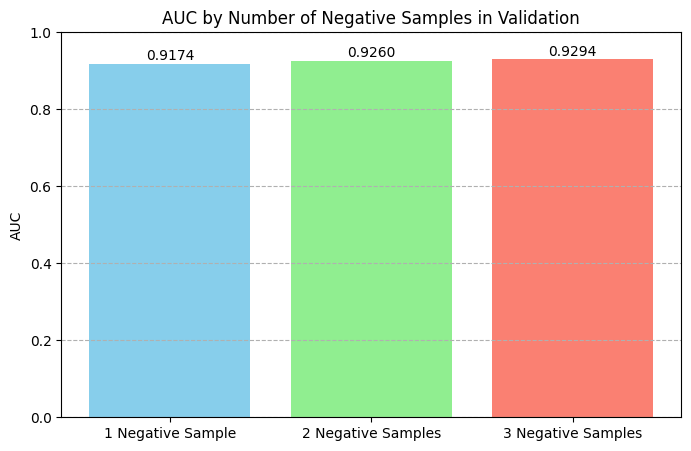

In [ ]:
import matplotlib.pyplot as plt

# AUC values for each scenario (from previous execution)
auc_values = [auc_1_neg, auc_2_neg, auc_3_neg]
scenario_labels = ['1 Negative Sample', '2 Negative Samples', '3 Negative Samples']

plt.figure(figsize=(8, 5))
plt.bar(scenario_labels, auc_values, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylabel('AUC')
plt.title('AUC by Number of Negative Samples in Validation')
plt.ylim(0, 1) # AUC values are between 0 and 1
plt.grid(axis='y', linestyle='--')

# Add the exact AUC value on top of each bar
for i, value in enumerate(auc_values):
    plt.text(i, value + 0.01, f'{value:.4f}', ha='center')

plt.show()

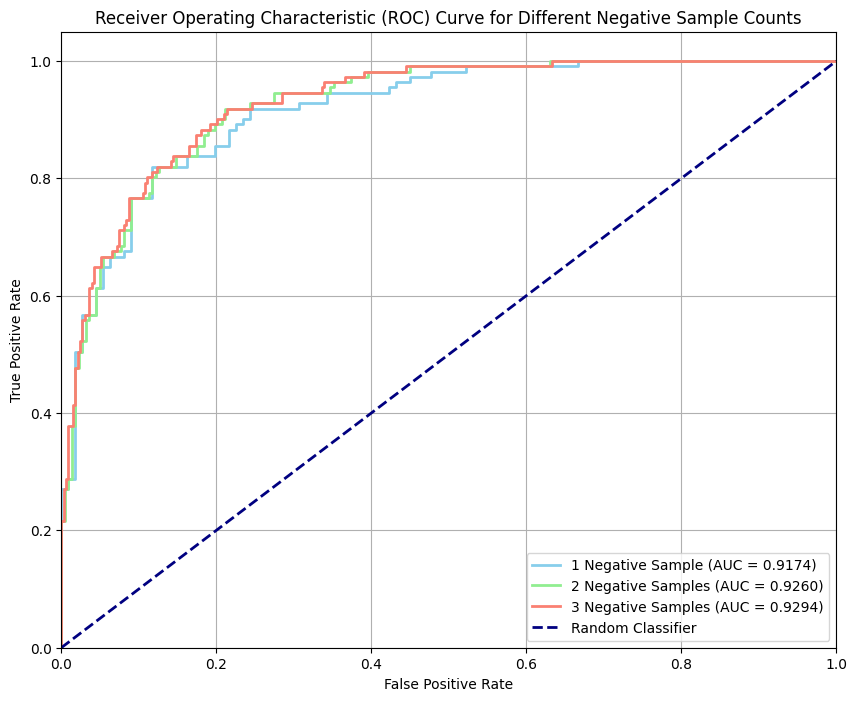

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Data for the three scenarios
data_3_neg = metrics_3_neg
data_2_neg = metrics_2_neg
data_1_neg = metrics_1_neg

# Calculate ROC curve and AUC for each scenario
fpr_3_neg, tpr_3_neg, thresholds_3_neg = roc_curve(data_3_neg['all_labels'], data_3_neg['all_similarity_scores'])
roc_auc_3_neg = auc(fpr_3_neg, tpr_3_neg)

fpr_2_neg, tpr_2_neg, thresholds_2_neg = roc_curve(data_2_neg['all_labels'], data_2_neg['all_similarity_scores'])
roc_auc_2_neg = auc(fpr_2_neg, tpr_2_neg)

fpr_1_neg, tpr_1_neg, thresholds_1_neg = roc_curve(data_1_neg['all_labels'], data_1_neg['all_similarity_scores'])
roc_auc_1_neg = auc(fpr_1_neg, tpr_1_neg)

# Plotting the ROC curves
plt.figure(figsize=(10, 8))
plt.plot(fpr_1_neg, tpr_1_neg, color='skyblue', lw=2, label=f'1 Negative Sample (AUC = {roc_auc_1_neg:.4f})')
plt.plot(fpr_2_neg, tpr_2_neg, color='lightgreen', lw=2, label=f'2 Negative Samples (AUC = {roc_auc_2_neg:.4f})')
plt.plot(fpr_3_neg, tpr_3_neg, color='salmon', lw=2, label=f'3 Negative Samples (AUC = {roc_auc_3_neg:.4f})')

# Plotting the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Classifier')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Different Negative Sample Counts')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

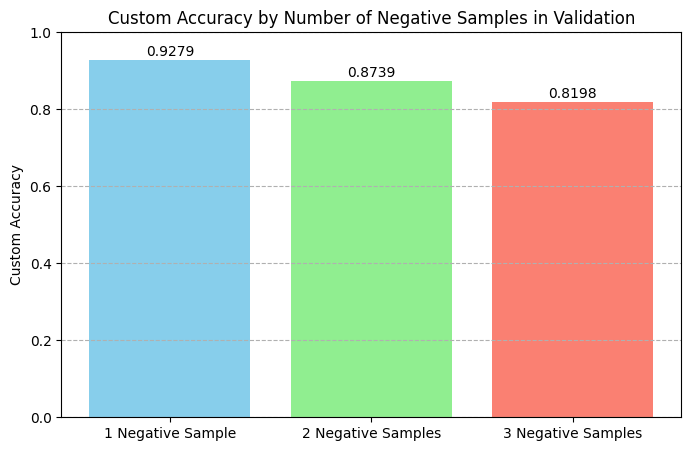

In [ ]:
import matplotlib.pyplot as plt

# Custom Accuracy values for each scenario (from previous execution)
accuracy_values = [metrics_1_neg['custom_accuracy'], metrics_2_neg['custom_accuracy'], metrics_3_neg['custom_accuracy']]
scenario_labels = ['1 Negative Sample', '2 Negative Samples', '3 Negative Samples']

plt.figure(figsize=(8, 5))
plt.bar(scenario_labels, accuracy_values, color=['skyblue', 'lightgreen', 'salmon'])
plt.ylabel('Custom Accuracy')
plt.title('Custom Accuracy by Number of Negative Samples in Validation')
plt.ylim(0, 1) # Accuracy values are between 0 and 1
plt.grid(axis='y', linestyle='--')

# Add the exact accuracy value on top of each bar
for i, value in enumerate(accuracy_values):
    plt.text(i, value + 0.01, f'{value:.4f}', ha='center')

plt.show()

## Explicabilidade do Modelo

